<a id='Q0'></a>
<center><a target="_blank" href="https://sit.academy/"><img src="https://drive.google.com/uc?id=1z0U84GYqhbWWpCenFajh8_8XFRGyOc3U" width="200" style="background:none; border:none; box-shadow:none;" /></a> </center>
<center> <h1> Exploratory Analysis of the Dataset IBM Attrition </h1> </center>
<p style="margin-bottom:1cm;"></p>
<center><h4>SIT Academy, 2022</h4></center>
<p style="margin-bottom:1cm;"></p>

<div style="background:#EEEDF5;border-top:0.1cm solid #EF475B;border-bottom:0.1cm solid #EF475B;">
    <div style="margin-left: 0.5cm;margin-top: 0.5cm;margin-bottom: 0.5cm;color:#303030">
        <p><strong>Goal:</strong> Perform logistic regression to figure out what influences attrition of employees</p>
        <strong> Outline:</strong>
        <a id='P0' name="P0"></a>
        <ol>
            <li> <a style="color:#303030" href='#I'>Introduction </a> </li>
            <li> <a style="color:#303030" href='#SU'>Set up</a></li>
            <li> <a style="color:#303030" href='#P1'>Part 1</a></li>
            <li> <a style="color:#303030" href='#P2'>Part 2</a></li>
            <li> <a style="color:#303030" href='#P3'>Part 3</a></li>
            <li> <a style="color:#303030" href='#CL'>Conclusion</a></li>
        </ol>
        <strong>Keywords:</strong> data cleaning, NLP, ... list of keywords.
    </div>
</div>
</nav>

<a id='I' name="I"></a>
## [Introduction](#P0)

Data set we will be exploring is the HR analytics from IBM accesible on KAGGLE. (https://www.kaggle.com/code/jacksonchou/hr-analytics/report)

<a id='SU' name="SU"></a>
## [Set up](#P0)

### Magics

In [1]:
# auto reload packages and modules when they are modified
%load_ext autoreload
%autoreload 2
# draw matplotlib plots in line
%matplotlib inline
# enforce PEP 8 code on jupyter lab ...
%load_ext lab_black
# ... or jupyter notebook
# %load_ext nb_black

### Packages

In [18]:
# General
import pandas as pd
import numpy as np

# modelling
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import (
    CountVectorizer,
    TfidfTransformer,
    TfidfVectorizer,
)

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt

import statsmodels.api as sm
import scipy.stats as st

from matplotlib import rcParams
import seaborn as sns

### Custom classes and functions

In [4]:
import sys
SCRIPT_DIR = "../src"
sys.path.append(SCRIPT_DIR)

In [132]:
# Helper function for adding the correlation coefficients
# to the top right plots.


def corr_annot(x, y, ax=None, **kws):
    """Annotate a plot w/ the correlation coefficient."""
    r, _ = st.pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f"ρ = {r:.2f}", xy=(0.1, 0.9), xycoords=ax.transAxes)

In [5]:
from template_module import my_function_name

### Global Parameters Setting

In [6]:
plt.style.use("seaborn")

### User-Dependent Variables

In [1]:
#url_features = ".../data/train_features.csv"  # path to data file

### Data

In [5]:
data = pd.read_csv("../data/raw/WA_Fn-UseC_-HR-Employee-Attrition.csv")

<a id='P1'></a>
## [Exploring the data](#P0)

Trying to find some insights that can inform the logistic regression.



In [12]:
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [8]:
data.describe

<bound method NDFrame.describe of       Age Attrition     BusinessTravel  DailyRate              Department  \
0      41       Yes      Travel_Rarely       1102                   Sales   
1      49        No  Travel_Frequently        279  Research & Development   
2      37       Yes      Travel_Rarely       1373  Research & Development   
3      33        No  Travel_Frequently       1392  Research & Development   
4      27        No      Travel_Rarely        591  Research & Development   
...   ...       ...                ...        ...                     ...   
1465   36        No  Travel_Frequently        884  Research & Development   
1466   39        No      Travel_Rarely        613  Research & Development   
1467   27        No      Travel_Rarely        155  Research & Development   
1468   49        No  Travel_Frequently       1023                   Sales   
1469   34        No      Travel_Rarely        628  Research & Development   

      DistanceFromHome  Education Educati

In [10]:
# all possible parameters
data.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [35]:
# types of variables
data.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [64]:
# dictionaries for transformation
# Index(['No', 'Yes'], dtype='object', name='Attrition')
att = {"No": 0, "Yes": 1}
data = data.replace({"Attrition": att})
# Index(['Non-Travel', 'Travel_Frequently', 'Travel_Rarely'], dtype='object', name='BusinessTravel')
tra = {"Non-Travel": 0, "Travel_Frequently": 2, "Travel_Rarely": 1}
data = data.replace({"BusinessTravel": tra})
# Index(['Female', 'Male'], dtype='object', name='Gender')
gen = {"Female": 0, "Male": 1}
data = data.replace({"Gender": gen})
# Index(['No', 'Yes'], dtype='object', name='OverTime')
ove = {"No": 0, "Yes": 1}
data = data.replace({"OverTime": ove})

In [65]:
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,0,2,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1,1,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,0,2,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,0,1,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [50]:
# change the objects to values
for i in data.columns:
    print(data.groupby(i).count().index)

Int64Index([18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
            35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
            52, 53, 54, 55, 56, 57, 58, 59, 60],
           dtype='int64', name='Age')
Index(['No', 'Yes'], dtype='object', name='Attrition')
Index(['Non-Travel', 'Travel_Frequently', 'Travel_Rarely'], dtype='object', name='BusinessTravel')
Int64Index([ 102,  103,  104,  105,  106,  107,  109,  111,  115,  116,
            ...
            1480, 1482, 1485, 1488, 1490, 1492, 1495, 1496, 1498, 1499],
           dtype='int64', name='DailyRate', length=886)
Index(['Human Resources', 'Research & Development', 'Sales'], dtype='object', name='Department')
Int64Index([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
            18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
           dtype='int64', name='DistanceFromHome')
Int64Index([1, 2, 3, 4, 5], dtype='int64', name='Education')
Index(['Human Resources', 'Life 

<AxesSubplot:>

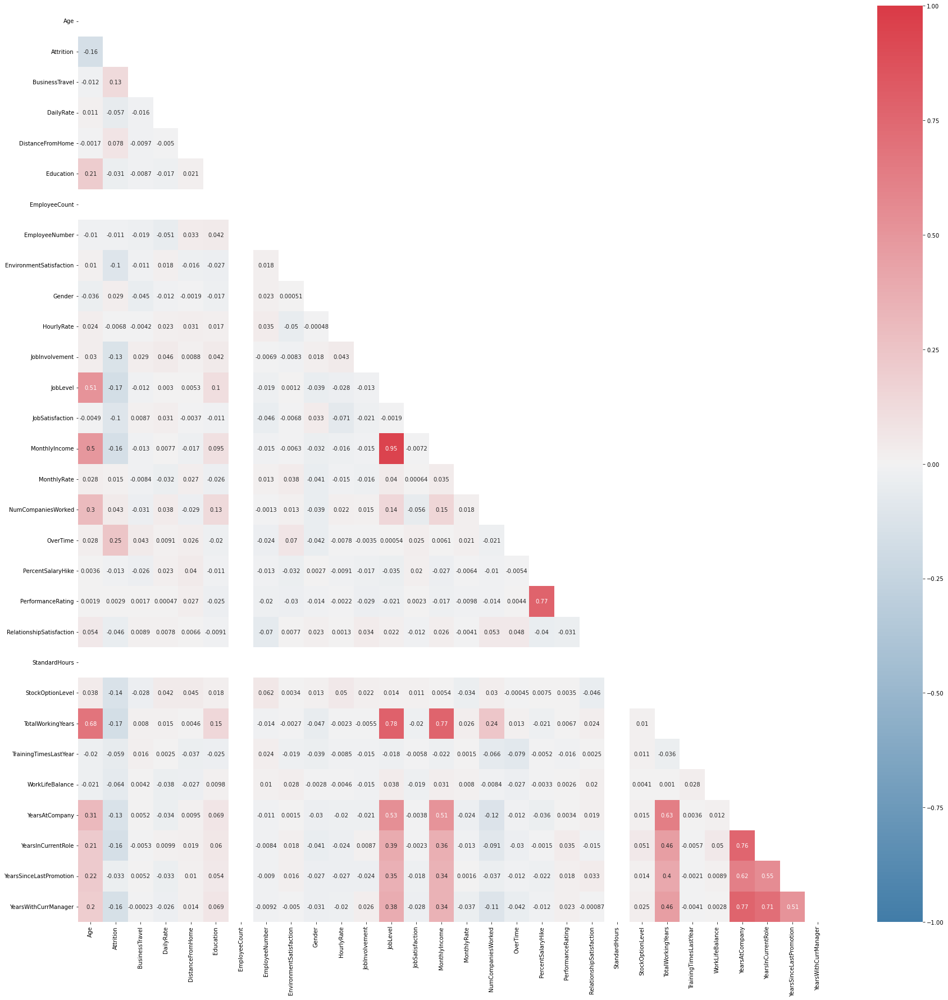

In [66]:
# check the relationships among the explanatory variables
corr = data.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
cmap = sns.diverging_palette(240, 10, as_cmap=True)

fig, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, cmap=cmap, annot=True, ax=ax)

<AxesSubplot:xlabel='MonthlyIncome', ylabel='MonthlyRate'>

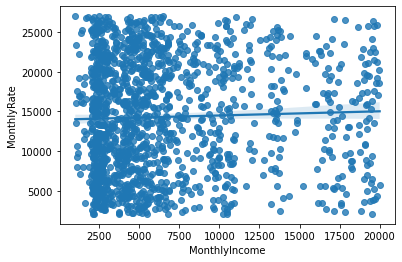

In [51]:
sns.regplot(x="MonthlyIncome", y="MonthlyRate", data=data)

<AxesSubplot:xlabel='HourlyRate', ylabel='MonthlyRate'>

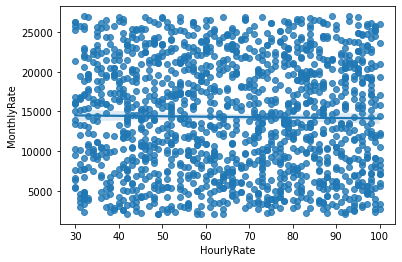

In [52]:
sns.regplot(x="HourlyRate", y="MonthlyRate", data=data)

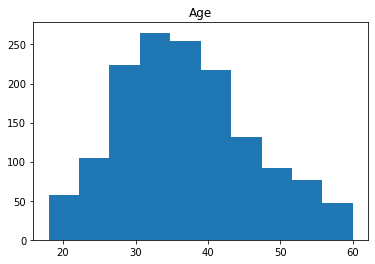

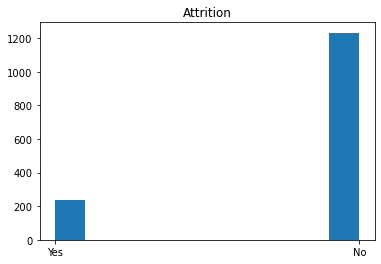

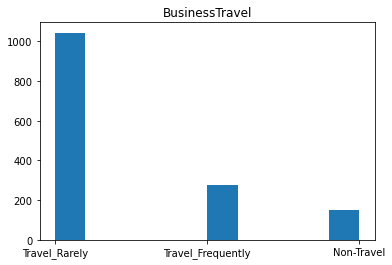

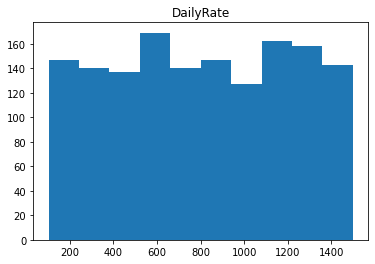

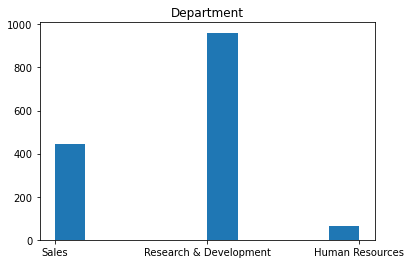

...

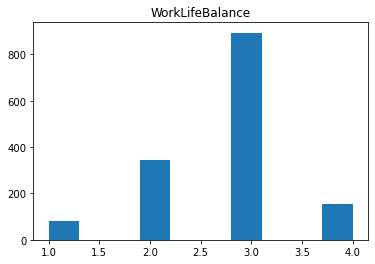

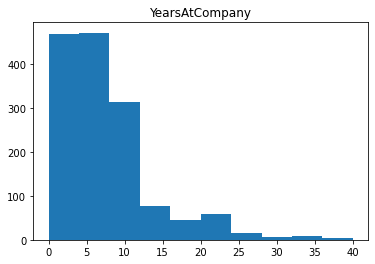

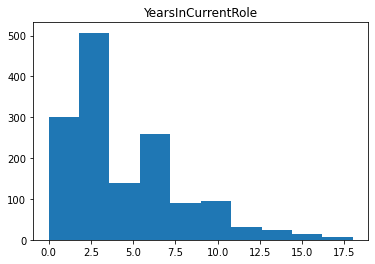

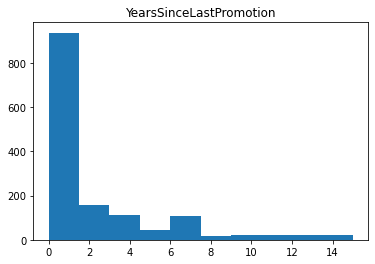

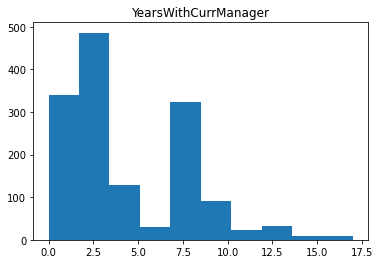

In [56]:
for i in list(data.columns):
    plt.hist(data[i])
    plt.title(i)
    plt.show()

In [74]:
# dropping these because based on histograms they do not bring much information
df = data.drop(
    [
        "DailyRate",
        "EmployeeCount",
        "EmployeeNumber",
        "HourlyRate",
        "MonthlyRate",
        "Over18",
        "StandardHours",
    ],
    axis=1,
).copy(deep=True)

In [59]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

<AxesSubplot:>

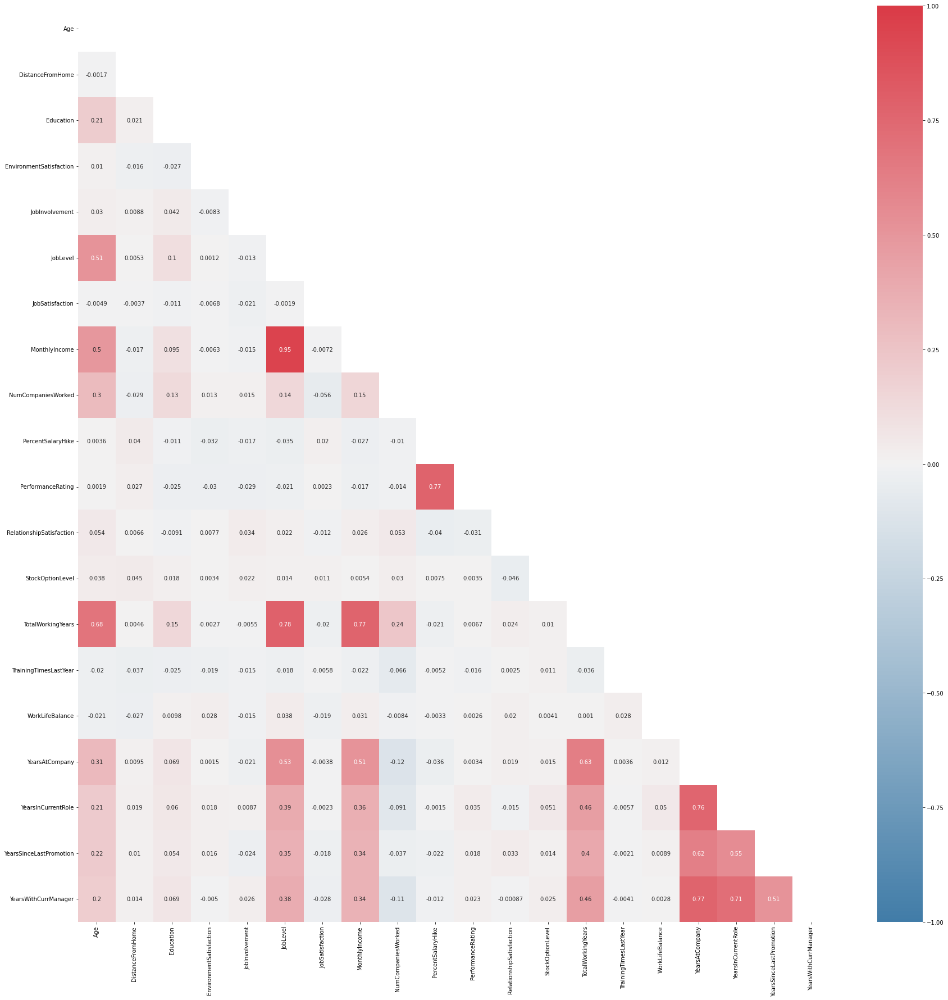

In [67]:
# check the relationships among the explanatory variables
corr = df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
cmap = sns.diverging_palette(240, 10, as_cmap=True)

fig, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, cmap=cmap, annot=True, ax=ax)

In [76]:
# dummy variables
# https://www.geeksforgeeks.org/how-to-convert-categorical-variable-to-numeric-in-pandas/
# careful about the dummy variable trap! drop one of the columns created with dummy variables

# DEPARTMENT
# Index(['Human Resources', 'Research & Development', 'Sales'], dtype='object', name='Department')
# we are creating columns 'Research & Development', 'Sales' instead, all the others are Human Recources, so we avoid the dummy variable trap
# get the dummies and store it in a variable
dummies = pd.get_dummies(df.Department)

# Concatenate the dummies to original dataframe
merged = pd.concat([df, dummies], axis="columns")

# merged.columns
# drop the values
merged = merged.drop(["Department", "Human Resources"], axis="columns")

# merged.columns

# similarly for
# Index(['Human Resources', 'Life Sciences', 'Marketing', 'Medical', 'Other', 'Technical Degree'], dtype='object', name='EducationField')
dummies2 = pd.get_dummies(df.EducationField)
merged2 = pd.concat([merged, dummies2], axis="columns")
merged2 = merged2.drop(["EducationField", "Other"], axis="columns")

# Index(['Healthcare Representative', 'Human Resources', 'Laboratory Technician','Manager', 'Manufacturing Director', 'Research Director','Research Scientist', 'Sales Executive', 'Sales Representative'],dtype='object', name='JobRole')
dummies3 = pd.get_dummies(df.JobRole)
merged3 = pd.concat([merged2, dummies3], axis="columns")
merged3 = merged3.drop(["JobRole", "Human Resources"], axis="columns")

# Index(['Divorced', 'Married', 'Single'], dtype='object', name='MaritalStatus')
dummies4 = pd.get_dummies(df.MaritalStatus)
merged4 = pd.concat([merged3, dummies4], axis="columns")
merged4 = merged4.drop(["MaritalStatus", "Single"], axis="columns")
merged4

,Age,Attrition,BusinessTravel,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobSatisfaction,...,Healthcare Representative,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative,Divorced,Married
0,41,1,1,1,2,2,0,3,2,4,...,0,0,0,0,0,0,1,0,0,0
1,49,0,2,8,1,3,1,2,2,2,...,0,0,0,0,0,1,0,0,0,1
2,37,1,1,2,2,4,1,2,1,3,...,0,1,0,0,0,0,0,0,0,0
3,33,0,2,3,4,4,0,3,1,3,...,0,0,0,0,0,1,0,0,0,1
4,27,0,1,2,1,1,1,3,1,2,...,0,1,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,2,23,2,3,1,4,2,4,...,0,1,0,0,0,0,0,0,0,1
1466,39,0,1,6,1,4,1,2,3,1,...,1,0,0,0,0,0,0,0,0,1
1467,27,0,1,4,3,2,1,4,2,2,...,0,0,0,1,0,0,0,0,0,1
1468,49,0,2,2,3,4,1,2,2,2,...,0,0,0,0,0,0,1,0,0,1


In [77]:
merged4.dtypes

Age                          int64
Attrition                    int64
BusinessTravel               int64
DistanceFromHome             int64
Education                    int64
EnvironmentSatisfaction      int64
Gender                       int64
JobInvolvement               int64
JobLevel                     int64
JobSatisfaction              int64
MonthlyIncome                int64
NumCompaniesWorked           int64
OverTime                     int64
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StockOptionLevel             int64
TotalWorkingYears            int64
TrainingTimesLastYear        int64
WorkLifeBalance              int64
YearsAtCompany               int64
YearsInCurrentRole           int64
YearsSinceLastPromotion      int64
YearsWithCurrManager         int64
Research & Development       uint8
Sales                        uint8
Life Sciences                uint8
Marketing                    uint8
Medical             

In [78]:
clean_df = merged4.copy(deep=True)

In [94]:
clean_df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
       'JobSatisfaction', 'MonthlyIncome', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'Research & Development', 'Sales', 'Life Sciences', 'Marketing',
       'Medical', 'Technical Degree', 'Healthcare Representative',
       'Laboratory Technician', 'Manager', 'Manufacturing Director',
       'Research Director', 'Research Scientist', 'Sales Executive',
       'Sales Representative', 'Divorced', 'Married'],
      dtype='object')

In [106]:
col_all = list(clean_df.columns)

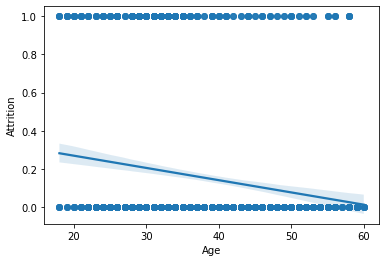

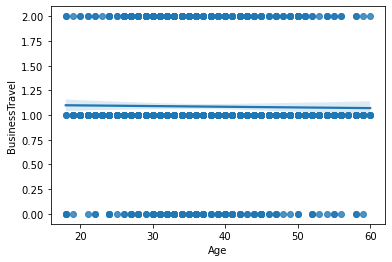

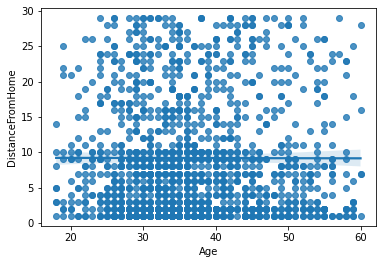

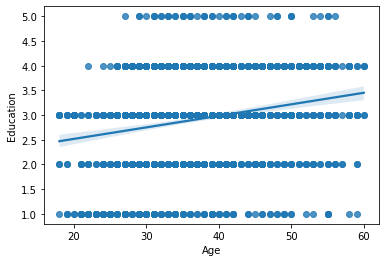

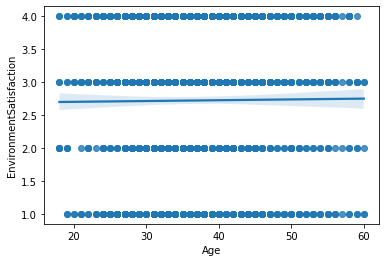

...

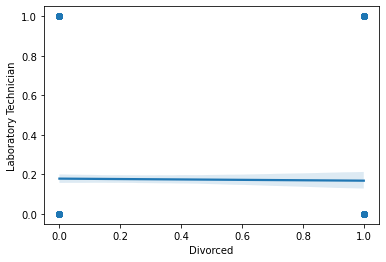

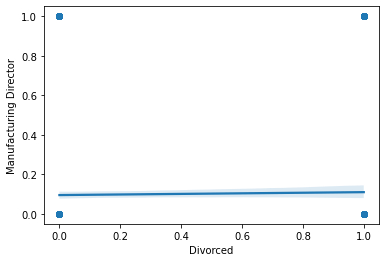

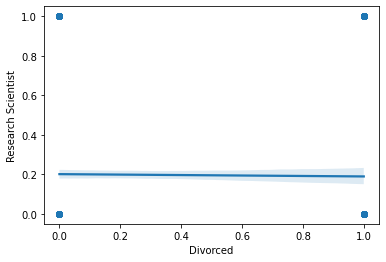

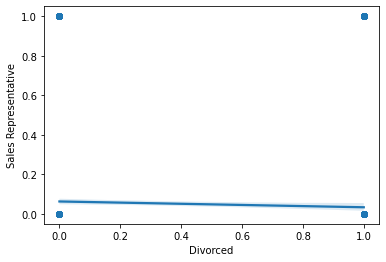

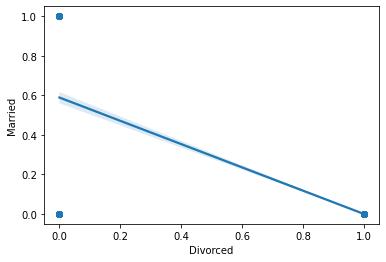

In [107]:
for i in col_all:
    col_all.remove(i)
    # print(col_all)
    for j in col_all:
        if i != j:
            sns.regplot(x=str(i), y=str(j), data=clean_df)
            plt.show()

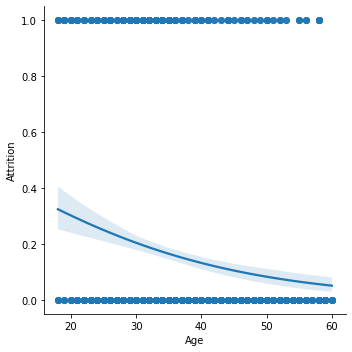

C:\Users\Betka\anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


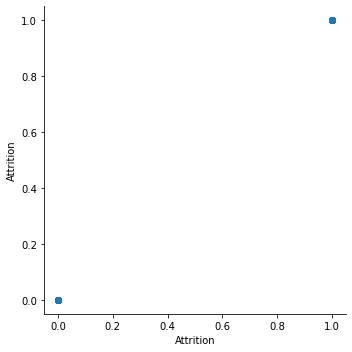

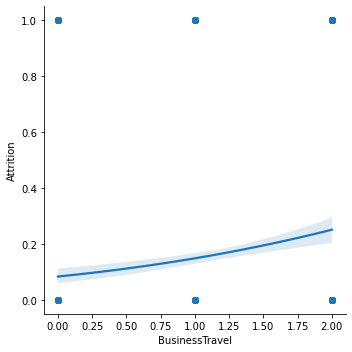

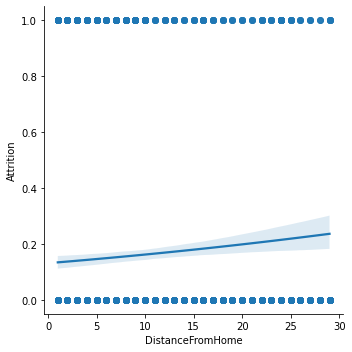

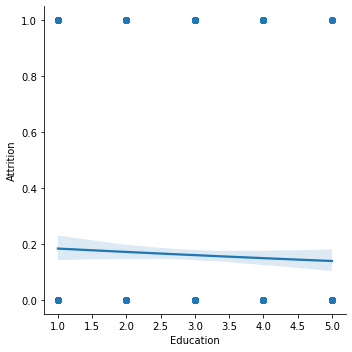

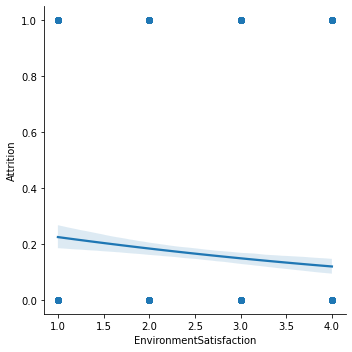

...

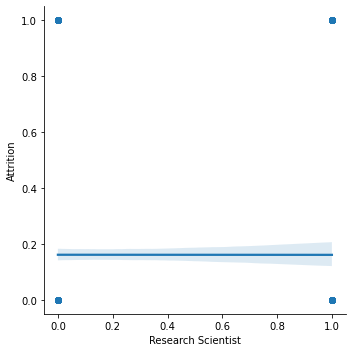

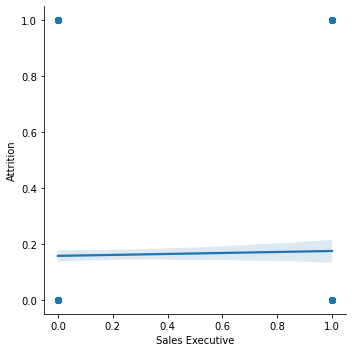

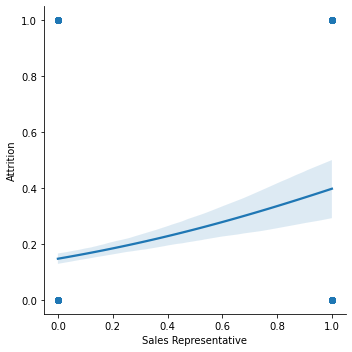

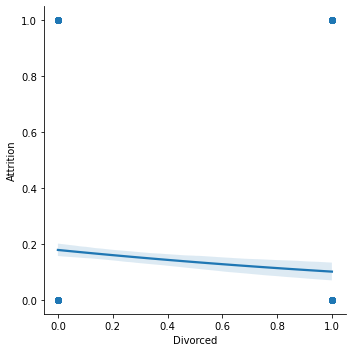

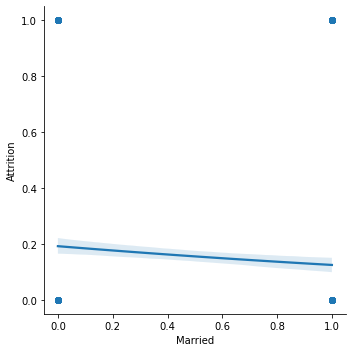

In [123]:
for i in clean_df.columns:
    sns.lmplot(x=str(i), y="Attrition", data=clean_df, logistic=True)
    plt.show()

<AxesSubplot:>

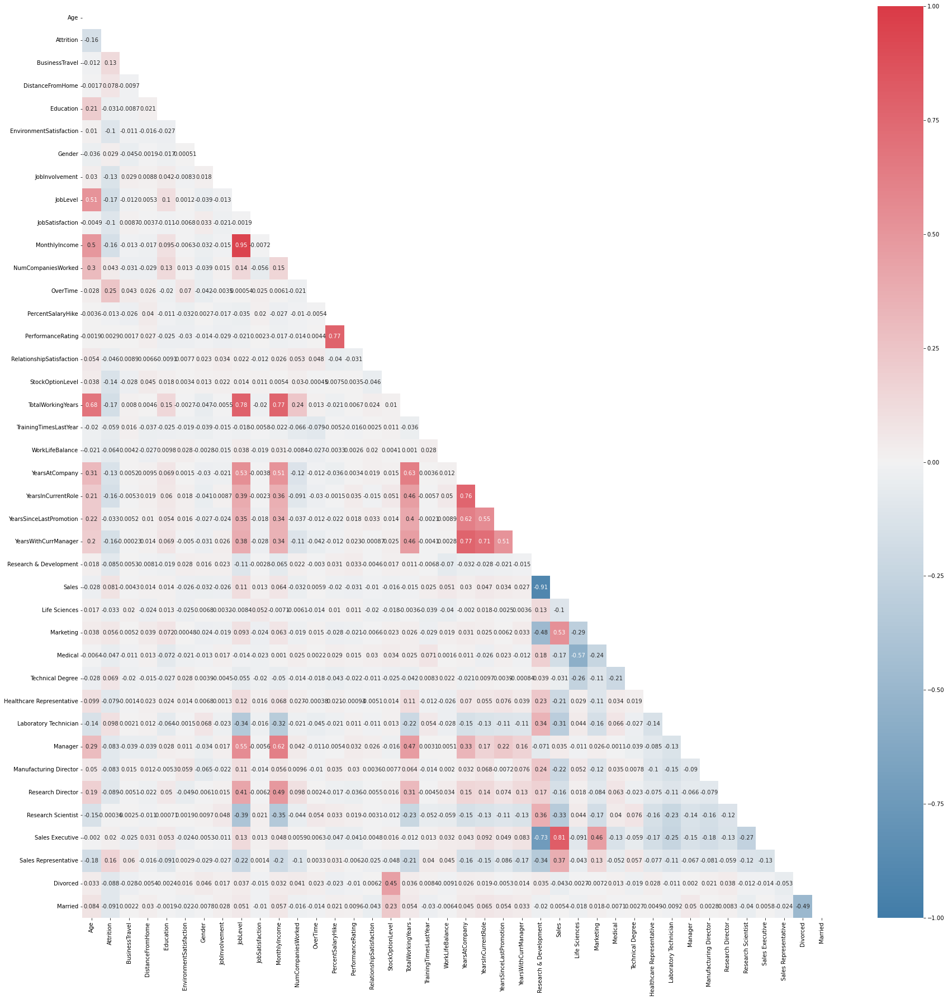

In [108]:
# check the relationships among the explanatory variables
corr = clean_df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
cmap = sns.diverging_palette(240, 10, as_cmap=True)

fig, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, cmap=cmap, annot=True, ax=ax)

In [109]:
clean_df.describe()

,Age,Attrition,BusinessTravel,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobSatisfaction,...,Healthcare Representative,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative,Divorced,Married
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,0.161224,1.086395,9.192517,2.912925,2.721769,0.600000,2.729932,2.063946,2.728571,...,0.089116,0.176190,0.069388,0.098639,0.054422,0.198639,0.221769,0.056463,0.222449,0.457823
std,9.135373,0.367863,0.532170,8.106864,1.024165,1.093082,0.490065,0.711561,1.106940,1.102846,...,0.285008,0.381112,0.254199,0.298279,0.226925,0.399112,0.415578,0.230891,0.416033,0.498387
min,18.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,1.000000,2.000000,2.000000,2.000000,0.000000,2.000000,1.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,36.000000,0.000000,1.000000,7.000000,3.000000,3.000000,1.000000,3.000000,2.000000,3.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,43.000000,0.000000,1.000000,14.000000,4.000000,4.000000,1.000000,3.000000,3.000000,4.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,60.000000,1.000000,2.000000,29.000000,5.000000,4.000000,1.000000,4.000000,5.000000,4.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [124]:
# trying regression with all the variables
Y = clean_df["Attrition"]
X = clean_df[
    [
        "Age",
        "BusinessTravel",
        "DistanceFromHome",
        "Education",
        "EnvironmentSatisfaction",
        "Gender",
        "JobInvolvement",
        "JobLevel",
        "JobSatisfaction",
        "MonthlyIncome",
        "NumCompaniesWorked",
        "OverTime",
        "PercentSalaryHike",
        "PerformanceRating",
        "RelationshipSatisfaction",
        "StockOptionLevel",
        "TotalWorkingYears",
        "TrainingTimesLastYear",
        "WorkLifeBalance",
        "YearsAtCompany",
        "YearsInCurrentRole",
        "YearsSinceLastPromotion",
        "YearsWithCurrManager",
        "Research & Development",
        "Sales",
        "Life Sciences",
        "Marketing",
        "Medical",
        "Technical Degree",
        "Healthcare Representative",
        "Laboratory Technician",
        "Manager",
        "Manufacturing Director",
        "Research Director",
        "Research Scientist",
        "Sales Executive",
        "Sales Representative",
        "Divorced",
        "Married",
    ]
]
X = sm.add_constant(X)
glm_binom = sm.GLM(Y, X, family=sm.families.Binomial())
results = glm_binom.fit()
print(results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Attrition   No. Observations:                 1470
Model:                            GLM   Df Residuals:                     1430
Model Family:                Binomial   Df Model:                           39
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -430.98
Date:                Wed, 14 Sep 2022   Deviance:                       861.97
Time:                        16:06:13   Pearson chi2:                 2.59e+03
No. Iterations:                    21   Pseudo R-squ. (CS):             0.2570
Covariance Type:            nonrobust                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [125]:
results.aic

941.968764754311

In [161]:
results.aic + ((2 * (40 ^ 2) + (2 * 40)) / (1470 - 40 - 1))

942.0835303246399

In [ ]:
# we need to drop some variables to try to impore our model
# maybe the ones, that are most correlated

In [150]:
corr = clean_df.corr()
corr = corr.mask(corr.apply(lambda x: x.name == x.index))

most_correlated = (
    corr.abs().unstack().drop_duplicates().sort_values(ascending=False)[:20]
)

most_correlated

JobLevel                MonthlyIncome              0.950300
Research & Development  Sales                      0.906818
Sales                   Sales Executive            0.808869
JobLevel                TotalWorkingYears          0.782208
PercentSalaryHike       PerformanceRating          0.773550
MonthlyIncome           TotalWorkingYears          0.772893
YearsAtCompany          YearsWithCurrManager       0.769212
                        YearsInCurrentRole         0.758754
Research & Development  Sales Executive            0.733497
YearsInCurrentRole      YearsWithCurrManager       0.714365
Age                     TotalWorkingYears          0.680381
TotalWorkingYears       YearsAtCompany             0.628133
MonthlyIncome           Manager                    0.619573
YearsAtCompany          YearsSinceLastPromotion    0.618409
Life Sciences           Medical                    0.568774
JobLevel                Manager                    0.552744
YearsInCurrentRole      YearsSinceLastPr

In [151]:
columns_of_interest = np.unique([i for j in most_correlated.index.to_list() for i in j])

columns_of_interest

array(['Age', 'JobLevel', 'Life Sciences', 'Manager', 'Marketing',
       'Medical', 'MonthlyIncome', 'PercentSalaryHike',
       'PerformanceRating', 'Research & Development', 'Sales',
       'Sales Executive', 'TotalWorkingYears', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'], dtype='<U23')

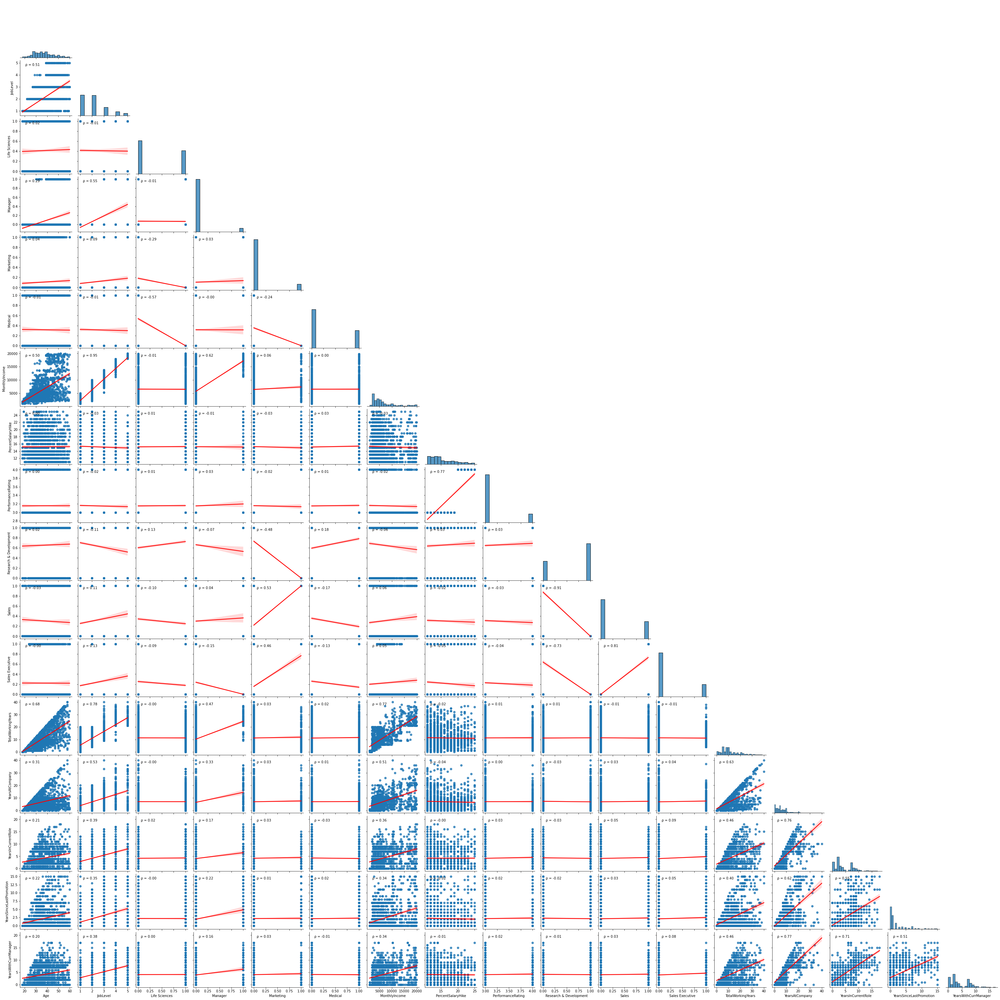

In [152]:
%%capture --no-display
corr_example = clean_df[columns_of_interest]

g = sns.pairplot(corr_example, kind = "reg", corner = True, plot_kws = {'line_kws':{'color':'red'}});
g.map_lower(corr_annot);

In [131]:
least_correlated = (
    corr.abs().unstack().drop_duplicates().sort_values(ascending=True)[:5]
)

least_correlated

BusinessTravel           YearsWithCurrManager         0.000229
Attrition                Research Scientist           0.000360
OverTime                 Healthcare Representative    0.000382
                         StockOptionLevel             0.000449
EnvironmentSatisfaction  Marketing                    0.000479
dtype: float64

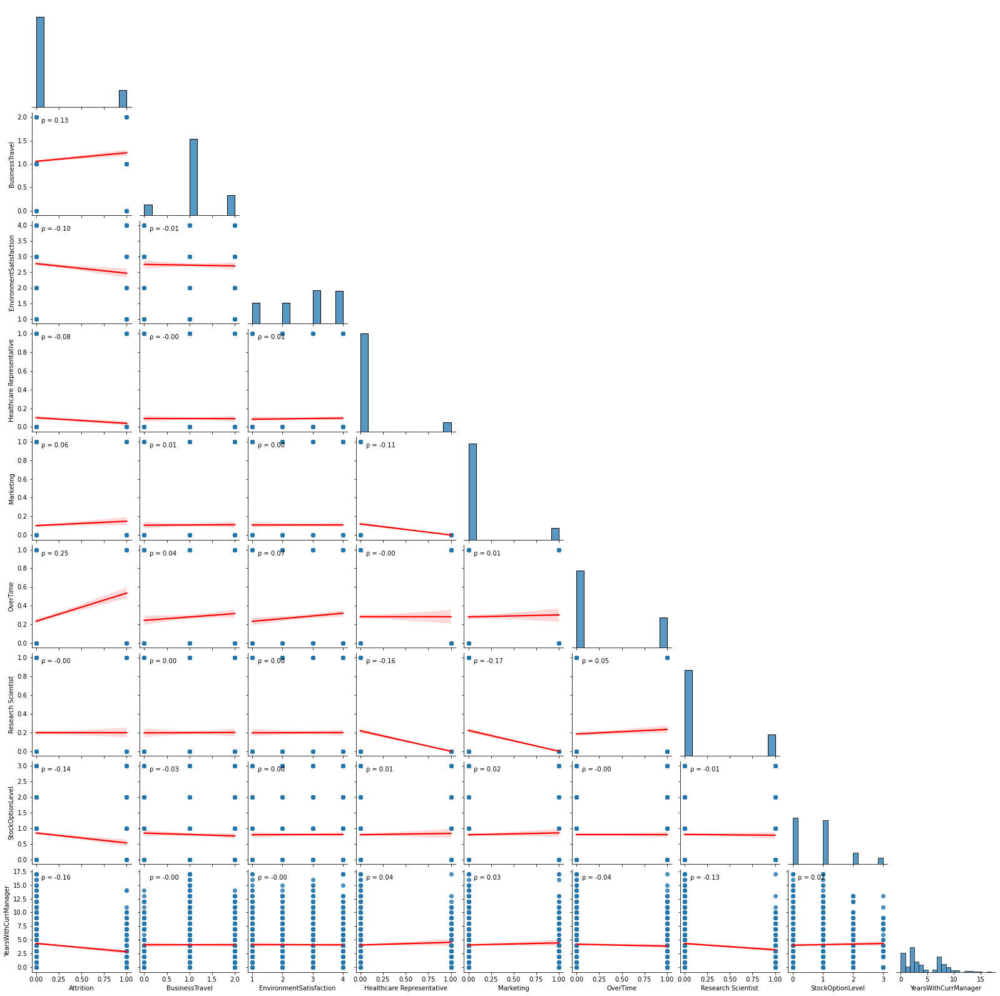

In [138]:
%%capture --no-display
columns_of_interest = np.unique(
    [i for j in least_correlated.index.to_list() for i in j]
    )

print(columns_of_interest)

corr_example = clean_df[columns_of_interest]

g = sns.pairplot(corr_example, kind = "reg", corner = True, plot_kws = {'line_kws':{'color':'red'}});
g.map_lower(corr_annot);

-------------------------------------------

### Selecting variables with reasonable predictive value

<ul>
            <li> we have data from 1470 unique people  </li>
            <li>some explanatory variables were dropped because based on the histograms we could see that they do not bring much predictive value </li>
            <li> we created dummy variables for the categorical data, to be able to use them in the model</li>
            <li> this results in 39 possible predictive variables</li>
            <li> because some of them are correlated, we presume dropping some of them could improve the model</li>
        </ul>






The top 10 correlated 
<ul>
<li>JobLevel                ~MonthlyIncome           ~0.950300</li>
<li>Research & Development  ~Sales                   ~0.906818</li>
<li>Sales                   ~Sales Executive         ~0.808869</li>
<li>JobLevel                ~TotalWorkingYears       ~0.782208</li>
<li>PercentSalaryHike       ~PerformanceRating       ~0.773550</li>
<li>MonthlyIncome           ~TotalWorkingYears       ~0.772893</li>
<li>YearsAtCompany          ~YearsWithCurrManager    ~0.769212</li>
<li>YearsAtCompany          ~YearsInCurrentRole      ~0.758754</li>
<li>Research & Development  ~Sales Executive         ~0.733497</li>
<li>YearsInCurrentRole      ~YearsWithCurrManager    ~0.714365</li>
    </ul>

It makes sense to remove one of the variables that are very correlated, since having both of likely does not bring more information. But it also does not make that much sense to remove one of the dummy variables that appear to be correlated. When choosing which variable to drop we decide to also think about the possible cuase and effect and what can be improved from a company stand pont.
<ul>
<li>JobLevel                ~MonthlyIncome           ~we drop the Job Level, Monthly Income seems easier to change by the company</li>
<li>Research & Development  ~Sales                   ~dummy variables, not dropping them</li>
<li>Sales                   ~Sales Executive         ~dummy variables, not dropping them</li>
<li>JobLevel                ~TotalWorkingYears       ~dropping Job level higher p value</li>
<li>PercentSalaryHike       ~PerformanceRating       ~dropping performance rating, company can improve the salary hike</li>
<li>MonthlyIncome           ~TotalWorkingYears       ~we drop the TotalWorkingYears, Monthly Income seems easier to change by the company</li>
<li>YearsAtCompany          ~YearsWithCurrManager    ~keeping years in current position, lowest p value from all three, and also some experience from Ella </li>
<li>YearsAtCompany          ~YearsInCurrentRole      </li>
<li>Research & Development  ~Sales Executive         ~also dummy variable</li>
<li>YearsInCurrentRole      ~YearsWithCurrManager    </li>
<li>YearsAtCompany         ~YearsSinceLastPromotion    ~</li>
<li>YearsInCurrentRole     ~YearsSinceLastPromotion    ~0.548056 we kept the years in current role </li>   
    
    </ul>
    </ul>

The model
<ul> log(p(attrition)/p(staying))=b0 + [b]*[variables]
    </ul>

In [156]:
Y1 = clean_df["Attrition"]
X1 = clean_df[
    [
        "Age",
        "BusinessTravel",
        "DistanceFromHome",
        "Education",
        "EnvironmentSatisfaction",
        "Gender",
        "JobInvolvement",
        "JobSatisfaction",
        "MonthlyIncome",
        "NumCompaniesWorked",
        "OverTime",
        "PercentSalaryHike",
        "RelationshipSatisfaction",
        "StockOptionLevel",
        "TrainingTimesLastYear",
        "WorkLifeBalance",
        "YearsInCurrentRole",
        # dummy variables for department
        "Research & Development",
        "Sales",
        # dummy variables for education
        "Life Sciences",
        "Marketing",
        "Medical",
        "Technical Degree",
        # dummy variables for job role
        "Healthcare Representative",
        "Laboratory Technician",
        "Manager",
        "Manufacturing Director",
        "Research Director",
        "Research Scientist",
        "Sales Executive",
        "Sales Representative",
        # dummy for marital status
        "Divorced",
        "Married",
    ]
]
X1 = sm.add_constant(X1)
glm_binom1 = sm.GLM(Y1, X1, family=sm.families.Binomial())
results1 = glm_binom1.fit()
print(results1.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Attrition   No. Observations:                 1470
Model:                            GLM   Df Residuals:                     1436
Model Family:                Binomial   Df Model:                           33
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -448.97
Date:                Thu, 15 Sep 2022   Deviance:                       897.94
Time:                        10:03:31   Pearson chi2:                 3.36e+03
No. Iterations:                    21   Pseudo R-squ. (CS):             0.2386
Covariance Type:            nonrobust                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [157]:
results1.aic

965.9446981269032

In [160]:
# AICc
results1.aic + ((2 * (33 ^ 2) + (2 * 33)) / (1470 - 33 - 1))

966.0394056477945

In [ ]:
# the model did not improve ... trying to drop also the large p value parameters from the dummies

In [162]:
Y2 = clean_df["Attrition"]
X2 = clean_df[
    [
        "Age",
        "BusinessTravel",
        "DistanceFromHome",
        "Education",
        "EnvironmentSatisfaction",
        "Gender",
        "JobInvolvement",
        "JobSatisfaction",
        "MonthlyIncome",
        "NumCompaniesWorked",
        "OverTime",
        "PercentSalaryHike",
        "RelationshipSatisfaction",
        "StockOptionLevel",
        "TrainingTimesLastYear",
        "WorkLifeBalance",
        "YearsInCurrentRole",
        # dummy variables for education
        "Life Sciences",
        "Medical",
        # dummy for marital status
        "Divorced",
        "Married",
    ]
]
X2 = sm.add_constant(X2)
glm_binom2 = sm.GLM(Y2, X2, family=sm.families.Binomial())
results2 = glm_binom2.fit()
print(results2.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Attrition   No. Observations:                 1470
Model:                            GLM   Df Residuals:                     1448
Model Family:                Binomial   Df Model:                           21
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -470.69
Date:                Thu, 15 Sep 2022   Deviance:                       941.37
Time:                        10:14:47   Pearson chi2:                 2.84e+03
No. Iterations:                     6   Pseudo R-squ. (CS):             0.2157
Covariance Type:            nonrobust                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [163]:
results2.aic

985.370379358525

In [ ]:
#even worst , it appears the best model is the one that has everything?

In [143]:
clean_df.shape

(1470, 40)

<div style="background:#EEEDF5;color:#303030"><div style="margin-left: .2cm">
    <b>Comments:</b>
</div></div>

<div style="margin-left: 0.4cm">
    This Markdown cell is a template to write extended comments. e.g. explain the approach taken, or concepts behind algorithm chosen. Aim at having 2 lines at least. Anything smaller can be directly integrated in the code, or gathered together with other comments to form a bigger paragraph. Since this block is within a div element, you need to use html formatting syntax, not markdown
</div>

<div style="background:#EEEDF5;border:0.1cm solid #FDB100;color:#303030">
    <div style="margin: 0.2cm 0.2cm 0.2cm 0.2cm">
        <b style="color:#FDB100">Title:</b> 
        This is a an example yellow box
    </div>
</div>

<div style="background:#EEEDF5;border:0.1cm solid #00BAE5;color:#303030">
    <div style="margin: 0.2cm 0.2cm 0.2cm 0.2cm">
        <b style="color:#00BAE5">Note:</b>
        This is an example Blue Box
    </div>
</div>

<div style="background:#EEEDF5;border:0.1cm solid #EF475B;color:#303030">
    <div style="margin: 0.2cm 0.2cm 0.2cm 0.2cm">
        <b style="color:#EF475B">Warning:</b> 
        This is an example red box
    </div>
</div>

<a id='P2' name="P2"></a>
## [Trying the spewise AIC from the Livecoding](#P0)

In [166]:
from time import time
import warnings


def glm_estimate(data=None, features=None, pred_class=None, print_run=True):
    y = data[pred_class]
    X = (
        data.drop(columns=pred_class)
        if features is None
        else data.drop(columns=pred_class)[features]
    )

    start_time = time()

    logit_model = sm.GLM(
        y,
        sm.add_constant(X),
        family=sm.families.Binomial(link=sm.genmod.families.links.logit()),
    )

    results = logit_model.fit(disp=True, method="bfgs", maxiter=1000)

    end_time = time()
    time_elapsed = end_time - start_time
    AIC_current = results.aic

    if print_run is True:
        print(
            f"Time taken: {time_elapsed}. AIC: {AIC_current}. # of features: {len(X.columns)}"
        )

    return results

In [167]:
from IPython.display import clear_output


def stepwise_selection(
    data,
    pred_class,
    initial_list=[],
    aic_step_min=2,
    # pval_threshold = 0.05,
    verbose=True,
):
    """Perform a forward feature selection
    based on AIC values from statsmodels.api.GLM.
    """

    y = data[pred_class]
    X = data.drop(columns=pred_class)
    included = list(initial_list)

    # Forward step
    def forward_step(y, X, included):
        while True:
            changed = False
            excluded = list(set(X.columns) - set(included))
            new_aic = pd.Series(index=excluded)
            for new_column in excluded:

                model = sm.GLM(
                    y,
                    sm.add_constant(X[included + [new_column]]),
                    family=sm.families.Binomial(link=sm.genmod.families.links.logit()),
                ).fit(method="bfgs", maxiter=1000)

                new_aic[new_column] = model.aic
            best_aic = new_aic.min()
            if abs(best_aic - new_aic.iloc[-1]) > aic_step_min and len(new_aic) > 1:
                clear_output(wait=True)
                best_feature = new_aic.idxmin()
                included.append(best_feature)
                changed = True
                if verbose:
                    print(
                        "Add  {:20} Current  AIC: {:.6}".format(best_feature, best_aic)
                    )
            if not changed:
                break
        print("Best AIC: {:.6}".format(best_aic))
        return (best_aic, included, model)

    return forward_step(y, X, included)

In [168]:
model = glm_estimate(data=clean_df, pred_class="Attrition")

pval = model.pvalues[1:]
pval_selected = pval[pval < 0.05]

pval_selected_columns = pval_selected.index.to_list()
pval_selected_columns

C:\Users\Betka\anaconda3\lib\site-packages\statsmodels\genmod\families\links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\Betka\anaconda3\lib\site-packages\statsmodels\genmod\families\family.py:1014: RuntimeWarning: divide by zero encountered in log
  special.gammaln(n - y + 1) + y * np.log(mu / (1 - mu + 1e-20)) +
C:\Users\Betka\anaconda3\lib\site-packages\statsmodels\genmod\families\family.py:1014: RuntimeWarning: invalid value encountered in multiply
  special.gammaln(n - y + 1) + y * np.log(mu / (1 - mu + 1e-20)) +


Optimization terminated successfully.
         Current function value: 0.293187
         Iterations: 261
         Function evaluations: 269
         Gradient evaluations: 269
Time taken: 0.24500036239624023. AIC: 941.9687647800652. # of features: 39


['Age',
 'BusinessTravel',
 'DistanceFromHome',
 'EnvironmentSatisfaction',
 'Gender',
 'JobInvolvement',
 'JobSatisfaction',
 'NumCompaniesWorked',
 'OverTime',
 'RelationshipSatisfaction',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'Divorced',
 'Married']

In [169]:
len(pval_selected_columns)
# paste combined into data frame
pval_selected_features = clean_df[pval_selected_columns + ["Attrition"]]

# modeling
reduced_space_model = glm_estimate(data=pval_selected_features, pred_class="Attrition")
reduced_space_model.summary()

Optimization terminated successfully.
         Current function value: 0.314628
         Iterations: 62
         Function evaluations: 64
         Gradient evaluations: 64
Time taken: 0.14200139045715332. AIC: 965.0049870116853. # of features: 19


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Attrition   No. Observations:                 1470
Model:                            GLM   Df Residuals:                     1450
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          bfgs   Log-Likelihood:                -462.50
Date:                Thu, 15 Sep 2022   Deviance:                       925.00
Time:                        10:33:30   Pearson chi2:                 3.13e+03
No. Iterations:                     0   Pseudo R-squ. (CS):             0.2244
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        3.8988      0.739      5.275      0.000       2.450       5.347
Age                         -0.0292      0.013     -2.260      0.024      -0.055      -0.004
BusinessTravel               0.9102      0.163      5.580      0.000       0.590       1.230
DistanceFromHome             0.0402      0.010      3.984      0.000       0.020       0.060
EnvironmentSatisfaction     -0.4081      0.078     -5.223      0.000      -0.561      -0.255
Gender                       0.4029      0.176      2.286      0.022       0.057       0.748
JobInvolvement              -0.5619      0.117     -4.804      0.000      -0.791      -0.333
JobSatisfaction             -0.4217      0.077     -5.443      0.000      -0.574      -0.270
NumCompaniesWorked           0.1767      0.036      4.891      0.000       0.106       0.247
OverTime                     1.8037      0.181      9.974      0.000       1.449       2.158
RelationshipSatisfaction    -0.2527      0.079     -3.214      0.001      -0.407      -0.099
TotalWorkingYears           -0.0999      0.024     -4.179      0.000      -0.147      -0.053
TrainingTimesLastYear       -0.1666      0.069     -2.404      0.016      -0.302      -0.031
WorkLifeBalance             -0.3038      0.116     -2.618      0.009      -0.531      -0.076
YearsAtCompany               0.0741      0.037      2.030      0.042       0.003       0.146
YearsInCurrentRole          -0.1305      0.043     -3.027      0.002      -0.215      -0.046
YearsSinceLastPromotion      0.1718      0.040      4.306      0.000       0.094       0.250
YearsWithCurrManager        -0.1257      0.045     -2.810      0.005      -0.213      -0.038
Divorced                    -1.4028      0.250     -5.621      0.000      -1.892      -0.914
Married                     -1.0418      0.190     -5.486      0.000      -1.414      -0.670
============================================================================================
"""

In [170]:
best_aic, features, model = stepwise_selection(
    pval_selected_features, pred_class="Attrition"
)
print(best_aic, features, model.params)

Add  RelationshipSatisfaction Current  AIC: 985.366


C:\Users\Betka\AppData\Local\Temp\ipykernel_8800\707540352.py:25: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_aic = pd.Series(index=excluded)


Best AIC: 980.595
980.5953539797409 ['OverTime', 'TotalWorkingYears', 'JobInvolvement', 'EnvironmentSatisfaction', 'BusinessTravel', 'JobSatisfaction', 'NumCompaniesWorked', 'Divorced', 'Married', 'DistanceFromHome', 'YearsSinceLastPromotion', 'YearsInCurrentRole', 'RelationshipSatisfaction'] const                       2.525522
OverTime                    1.733758
TotalWorkingYears          -0.111938
JobInvolvement             -0.596478
EnvironmentSatisfaction    -0.395027
BusinessTravel              0.884144
JobSatisfaction            -0.391442
NumCompaniesWorked          0.150676
Divorced                   -1.317404
Married                    -0.998172
DistanceFromHome            0.038900
YearsSinceLastPromotion     0.177479
YearsInCurrentRole         -0.136566
RelationshipSatisfaction   -0.247018
TrainingTimesLastYear      -0.173908
dtype: float64


In [171]:
print(f"Features used in best model (AIC: {best_aic}):")
print(features)
print(model.summary())

Features used in best model (AIC: 980.5953539797409):
['OverTime', 'TotalWorkingYears', 'JobInvolvement', 'EnvironmentSatisfaction', 'BusinessTravel', 'JobSatisfaction', 'NumCompaniesWorked', 'Divorced', 'Married', 'DistanceFromHome', 'YearsSinceLastPromotion', 'YearsInCurrentRole', 'RelationshipSatisfaction']
                 Generalized Linear Model Regression Results                  
Dep. Variable:              Attrition   No. Observations:                 1470
Model:                            GLM   Df Residuals:                     1455
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          bfgs   Log-Likelihood:                -475.33
Date:                Thu, 15 Sep 2022   Deviance:                       950.66
Time:                        10:34:02   Pearson chi2:                 4.00e+03
No. Iterations:                     0   Pseudo R-squ. (C

<a id='P3' name="P3"></a>
## [Trying the same on the subset of data 90%(1323), Leaving 147 to evaluate how well it predicts](#P0)

In [173]:
train_df = clean_df.sample(frac=0.9, random_state=200)
test_df = clean_df.drop(train_df.index)

In [183]:
train_df.groupby("Attrition").count()

,Age,BusinessTravel,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,Healthcare Representative,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative,Divorced,Married
Attrition,,,,,,,,,,,,,,,,,,,,,
0,1107,1107,1107,1107,1107,1107,1107,1107,1107,1107,...,1107,1107,1107,1107,1107,1107,1107,1107,1107,1107
1,216,216,216,216,216,216,216,216,216,216,...,216,216,216,216,216,216,216,216,216,216


In [185]:
216 / 1107

0.1951219512195122

In [184]:
test_df.groupby("Attrition").count()

,Age,BusinessTravel,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,Healthcare Representative,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative,Divorced,Married
Attrition,,,,,,,,,,,,,,,,,,,,,
0,126,126,126,126,126,126,126,126,126,126,...,126,126,126,126,126,126,126,126,126,126
1,21,21,21,21,21,21,21,21,21,21,...,21,21,21,21,21,21,21,21,21,21


In [186]:
21 / 126

0.16666666666666666

In [175]:
# trying regression with all the variables
Y_t = train_df["Attrition"]
X_t = train_df.drop(columns="Attrition")
X_t = sm.add_constant(X_t)
glm_binom_t = sm.GLM(Y_t, X_t, family=sm.families.Binomial())
results_train = glm_binom_t.fit()
print(results_train.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Attrition   No. Observations:                 1323
Model:                            GLM   Df Residuals:                     1283
Model Family:                Binomial   Df Model:                           39
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -392.35
Date:                Thu, 15 Sep 2022   Deviance:                       784.69
Time:                        11:11:32   Pearson chi2:                 2.11e+03
No. Iterations:                    21   Pseudo R-squ. (CS):             0.2569
Covariance Type:            nonrobust                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [176]:
results_train.aic

864.6947214231263

In [ ]:
# trying the stepwise AIC

In [177]:
model_train = glm_estimate(data=train_df, pred_class="Attrition")

pval = model_train.pvalues[1:]
pval_selected = pval[pval < 0.05]

pval_selected_columns = pval_selected.index.to_list()
pval_selected_columns

C:\Users\Betka\anaconda3\lib\site-packages\statsmodels\genmod\families\links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\Betka\anaconda3\lib\site-packages\statsmodels\genmod\families\family.py:1014: RuntimeWarning: divide by zero encountered in log
  special.gammaln(n - y + 1) + y * np.log(mu / (1 - mu + 1e-20)) +
C:\Users\Betka\anaconda3\lib\site-packages\statsmodels\genmod\families\family.py:1014: RuntimeWarning: invalid value encountered in multiply
  special.gammaln(n - y + 1) + y * np.log(mu / (1 - mu + 1e-20)) +


Optimization terminated successfully.
         Current function value: 0.296559
         Iterations: 262
         Function evaluations: 269
         Gradient evaluations: 269
Time taken: 0.2359905242919922. AIC: 864.6947214203822. # of features: 39


['Age',
 'BusinessTravel',
 'DistanceFromHome',
 'EnvironmentSatisfaction',
 'Gender',
 'JobInvolvement',
 'JobSatisfaction',
 'NumCompaniesWorked',
 'OverTime',
 'RelationshipSatisfaction',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'Divorced',
 'Married']

In [178]:
len(pval_selected_columns)
# paste combined into data frame
pval_selected_features = train_df[pval_selected_columns + ["Attrition"]]

# modeling
reduced_space_model = glm_estimate(data=pval_selected_features, pred_class="Attrition")
reduced_space_model.summary()

Optimization terminated successfully.
         Current function value: 0.316929
         Iterations: 60
         Function evaluations: 62
         Gradient evaluations: 62
Time taken: 0.056995391845703125. AIC: 878.5939582042051. # of features: 19


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Attrition   No. Observations:                 1323
Model:                            GLM   Df Residuals:                     1303
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          bfgs   Log-Likelihood:                -419.30
Date:                Thu, 15 Sep 2022   Deviance:                       838.59
Time:                        11:15:07   Pearson chi2:                 2.33e+03
No. Iterations:                     0   Pseudo R-squ. (CS):             0.2260
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        3.9833      0.775      5.142      0.000       2.465       5.502
Age                         -0.0351      0.014     -2.580      0.010      -0.062      -0.008
BusinessTravel               0.9021      0.171      5.273      0.000       0.567       1.237
DistanceFromHome             0.0390      0.011      3.653      0.000       0.018       0.060
EnvironmentSatisfaction     -0.4292      0.082     -5.208      0.000      -0.591      -0.268
Gender                       0.4491      0.186      2.414      0.016       0.085       0.814
JobInvolvement              -0.5362      0.124     -4.338      0.000      -0.779      -0.294
JobSatisfaction             -0.4438      0.081     -5.459      0.000      -0.603      -0.284
NumCompaniesWorked           0.1754      0.038      4.558      0.000       0.100       0.251
OverTime                     1.7856      0.190      9.382      0.000       1.413       2.159
RelationshipSatisfaction    -0.2384      0.083     -2.882      0.004      -0.401      -0.076
TotalWorkingYears           -0.1114      0.026     -4.229      0.000      -0.163      -0.060
TrainingTimesLastYear       -0.1319      0.073     -1.814      0.070      -0.274       0.011
WorkLifeBalance             -0.2740      0.123     -2.225      0.026      -0.515      -0.033
YearsAtCompany               0.0721      0.039      1.826      0.068      -0.005       0.150
YearsInCurrentRole          -0.1083      0.046     -2.360      0.018      -0.198      -0.018
YearsSinceLastPromotion      0.1807      0.042      4.271      0.000       0.098       0.264
YearsWithCurrManager        -0.1324      0.047     -2.800      0.005      -0.225      -0.040
Divorced                    -1.4521      0.266     -5.450      0.000      -1.974      -0.930
Married                     -1.0433      0.199     -5.247      0.000      -1.433      -0.654
============================================================================================
"""

In [179]:
best_aic, features, model = stepwise_selection(
    pval_selected_features, pred_class="Attrition"
)
print(best_aic, features, model.params)

Add  Gender               Current  AIC: 885.59


C:\Users\Betka\AppData\Local\Temp\ipykernel_8800\707540352.py:25: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_aic = pd.Series(index=excluded)


Best AIC: 882.389
882.3885286979717 ['OverTime', 'TotalWorkingYears', 'EnvironmentSatisfaction', 'JobSatisfaction', 'BusinessTravel', 'JobInvolvement', 'NumCompaniesWorked', 'Divorced', 'Married', 'DistanceFromHome', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'Age', 'RelationshipSatisfaction', 'Gender'] const                       3.123186
OverTime                    1.762851
TotalWorkingYears          -0.096266
EnvironmentSatisfaction    -0.425271
JobSatisfaction            -0.430929
BusinessTravel              0.880923
JobInvolvement             -0.533380
NumCompaniesWorked          0.157420
Divorced                   -1.381189
Married                    -1.048901
DistanceFromHome            0.038639
YearsSinceLastPromotion     0.179495
YearsWithCurrManager       -0.132799
Age                        -0.034591
RelationshipSatisfaction   -0.224962
Gender                      0.452644
TrainingTimesLastYear      -0.134716
dtype: float64


In [180]:
print(f"Features used in best model (AIC: {best_aic}):")
print(features)
print(model.summary())

Features used in best model (AIC: 882.3885286979717):
['OverTime', 'TotalWorkingYears', 'EnvironmentSatisfaction', 'JobSatisfaction', 'BusinessTravel', 'JobInvolvement', 'NumCompaniesWorked', 'Divorced', 'Married', 'DistanceFromHome', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'Age', 'RelationshipSatisfaction', 'Gender']
                 Generalized Linear Model Regression Results                  
Dep. Variable:              Attrition   No. Observations:                 1323
Model:                            GLM   Df Residuals:                     1306
Model Family:                Binomial   Df Model:                           16
Link Function:                  logit   Scale:                          1.0000
Method:                          bfgs   Log-Likelihood:                -425.01
Date:                Thu, 15 Sep 2022   Deviance:                       850.02
Time:                        11:15:56   Pearson chi2:                 2.54e+03
No. Iterations:                     0

<a id='CL'></a>
## [Conclusion](#P0)

Seems the one using all reasonable predictors is the best. (glm_binom_t)


In [ ]:
# getting predictions from the trained model for the test data

<div style="border-top:0.1cm solid #EF475B"></div>
    <strong><a href='#Q0'><div style="text-align: right"> <h3>End of this Notebook.</h3></div></a></strong>